[__<< Data Cleaning__](./02_Divvy_data_cleaning.ipynb) | [__Home__](../README.md) | [__Feature Engineering >>__](./04_Divvy_feature_engineering.ipynb)


# Divvy: Bike Sharing Forecast
## Exploratory Data Analysis

__Dataset:__ [Divvy Data](https://divvybikes.com/system-data) \
__Author:__ [Dmitry Luchkin](https://www.linkedin.com/in/dmitry-luchkin/) \
__Version:__ 1.0.0\
__Date:__ 9 August 2024

### Goals/Objectives <a name="objectives"></a>

- Generate descriptive statistics for each column.
- Plot histograms or density plots for numerical variables.
- Create bar plots for categorical variables to understand their distribution.
- Create correlation matrices to identify relationships between numerical variables.
- Plot time series data to observe trends and seasonal patterns.
- Map data points to visualize geographical distribution.
- Verify that data values are consistent across different columns.
- Ensure numerical values fall within expected ranges.
- Check for logical inconsistencies


### Notebooks <a class="anchor" name='notebooks'></a>

+ [Initial Data Exploration](./01_Divvy_data_exploration.ipynb)
+ [Data Cleaning](./02_Divvy_data_cleaning.ipynb)
+ __[Exploratory Data Analysis](./03_Divvy_exploratory_data_analysis.ipynb)__
+ [Feature Engineering](./04_Divvy_feature_engineering.ipynb)
+ [Modeling & Validation](./05_Divvy_modeling.ipynb)

### Import Libraries <a name='import-libraries'></a>

In [1]:
import datetime
import sys
import re
import pickle

import pandas as pd
import numpy as np
import statsmodels as sm
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

sys.path.append('../02_scripts/')

%matplotlib inline

### Notebook Setup <a name='notebook-setup'></a>

In [2]:
# Pandas settings
pd.options.display.max_rows = 20
pd.options.display.max_columns = None
pd.options.display.max_colwidth = 60
pd.options.display.float_format = '{:,.4f}'.format

# Visualization settings
from matplotlib import rcParams
plt.style.use('fivethirtyeight')
rcParams['figure.figsize'] = (16, 5)   
rcParams['axes.spines.right'] = False
rcParams['axes.spines.top'] = False
rcParams['font.size'] = 12
rcParams['savefig.dpi'] = 300
plt.rc('xtick', labelsize=11)
plt.rc('ytick', labelsize=11)
%config InlineBackend.figure_format = 'retina'

In [3]:
from IPython.display import Markdown
from IPython.core.magic import register_cell_magic


@register_cell_magic
def markdown(line, cell):
    return Markdown(cell.format(**globals()))

### ToDo's <a name='todos'></a>

In [4]:
# get all tasks from the previous phase

sys.path.append('../02_scripts/')
from todo_list import extract_todo_patterns

print(f'{'-'*5} TASKS FROM PREVIOUS PHASE {'-'*5}')
for todo in extract_todo_patterns('./02_Divvy_data_cleaning.ipynb'):
    print(f'TODO: {todo}')


----- TASKS FROM PREVIOUS PHASE -----
TODO: Use median instead of mean for `distance_km`, `duration_min` and `avg_speed_kmph`, such as median is more robust to outliers


### Loading Data <a name='loading-data'></a>

In [5]:
# loading data
%store -r data_divvy

In [6]:
data = data_divvy

In [7]:
%store -d data_divvy

In [8]:
# check data
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 22151779 entries, 0 to 22929302
Data columns (total 25 columns):
 #   Column              Dtype         
---  ------              -----         
 0   ride_id             object        
 1   started_at          datetime64[ns]
 2   ended_at            datetime64[ns]
 3   start_station_name  object        
 4   start_station_id    object        
 5   end_station_name    object        
 6   end_station_id      object        
 7   start_lat           float64       
 8   start_lng           float64       
 9   end_lat             float64       
 10  end_lng             float64       
 11  rider_type          category      
 12  bike_type           category      
 13  year                int32         
 14  quarter             category      
 15  month               category      
 16  day                 int32         
 17  hour                int32         
 18  minute              int32         
 19  season              category      
 20  weekd

### EDA <a name='eda'></a>

#### Summary Statistics <a name='summary-statistics'></a>

In [9]:
data.describe().T

,count,mean,min,25%,50%,75%,max,std
started_at,22151779,2022-06-07 11:21:58.861950720,2020-01-01 00:04:44,2021-07-06 17:10:43,2022-06-30 22:51:33,2023-06-30 12:13:42,2024-06-30 23:55:17.066000,NaN
ended_at,22151779,2022-06-07 11:41:14.482014720,2020-01-01 00:13:15,2021-07-06 17:30:01,2022-06-30 23:06:47,2023-06-30 12:30:27.500000,2024-06-30 23:59:57.930000,NaN
start_lat,"22,151,779.0000",41.9027,41.6300,41.8813,41.8992,41.9300,42.0800,0.0448
start_lng,"22,151,779.0000",-87.6464,-87.9400,-87.6600,-87.6431,-87.6293,-87.4600,0.0275
end_lat,"22,151,779.0000",41.9030,41.4800,41.8817,41.9000,41.9300,42.3700,0.0449
end_lng,"22,151,779.0000",-87.6467,-88.1600,-87.6601,-87.6434,-87.6295,-87.3000,0.0276
year,"22,151,779.0000","2,021.8994","2,020.0000","2,021.0000","2,022.0000","2,023.0000","2,024.0000",1.2352
day,"22,151,779.0000",15.6405,1.0000,8.0000,16.0000,23.0000,31.0000,8.7711
hour,"22,151,779.0000",14.1755,0.0000,11.0000,15.0000,18.0000,23.0000,4.9256
minute,"22,151,779.0000",29.5173,0.0000,15.0000,30.0000,45.0000,59.0000,17.2947


In [10]:
categorical_cols = data.select_dtypes(include=['object', 'category']).columns
numeric_cols = data.select_dtypes(include=np.number).columns

#### Numerical columns

In [11]:
numeric_cols

Index(['start_lat', 'start_lng', 'end_lat', 'end_lng', 'year', 'day', 'hour',
       'minute', 'duration_min', 'distance_km', 'avg_speed_kmph'],
      dtype='object')

In [12]:
def distplot(df, columns, by=None, plots='all'):
    """
        Builds distribution plot (histogram, box plot, violine plot)

        Args:
            df (pandas.DataFrame): The dataset
            columns ([str]): The list of column names for which the dist plots will be built
            by ([str]): The column names to group the plots by
            plots (str: "h|b|v|all"): Determines which plots will be built: 
                                      h - histogram, b - boxplot, v - violine, all - all plots.
                                      The combinations are possible.

        Usage:
            # Build all distribution plots (histogram, boxplot, violine plot)
            distplot(df, ['distance_km', 'duration_min'])

            # Build histogram plot only by rider_type
            distplot(df, ['distance_km', 'duration_min'], by='rider_type', plots='h')

            # Build histogram and box plots by bike_type
            distplot(df, ['distance_km', 'duration_min'], by='bike_type', plots='hb')
    """
    
    for var_name in columns:
        print(f'\n[`{var_name}`]')
        if by is not None:
            print(f'Skewness:\n{np.round(df.groupby(by, observed=True)[var_name].skew(), 2)}')
        else:
            print(f'Skewness: {round(df[var_name].skew(), 2)}')
        print("""
        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        """)
        
        if by is not None:
            print(f'Kurtosis:\n{np.round(df.groupby(by, observed=True)[var_name].apply(pd.Series.kurt), 2)}')
        else:
            print(f'Kurtosis: {round(df[var_name].kurt(), 2)}')
        print("""
        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        """)
        
        plots_list = list('hbv' if plots == 'all' else plots)
        plots_count = len(plots_list)
        plt.figure(figsize = (6*plots_count, 6))
        bins = int(np.ceil(np.sqrt(df.shape[0])))
        for index, plot in zip(range(1, len(plots)+1), plots_list):
            if plot == 'h':
                plt.subplot(1, plots_count, index)
                sns.histplot(data=df, x=var_name, kde=True, bins=bins, hue=by)
                plt.ylabel('Frequence')
                plt.xlabel(var_name)
                plt.title(f'Distribution of {var_name}')
            if  plot == 'b':
                plt.subplot(1, plots_count, index)
                sns.boxplot(data=df, y=var_name, hue=by)
                plt.title(f'Box plot of {var_name}')
            if  plot == 'v':
                plt.subplot(1, plots_count, index)
                sns.violinplot(data=df, y=var_name, hue=by)
                plt.title(f'Violin plot of {var_name}')
            
        plt.show()


[`start_lat`]
Skewness:
rider_type
casual   -0.4900
member   -0.3300
Name: start_lat, dtype: float64

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis:
rider_type
casual   2.8800
member   1.7300
Name: start_lat, dtype: float64

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        


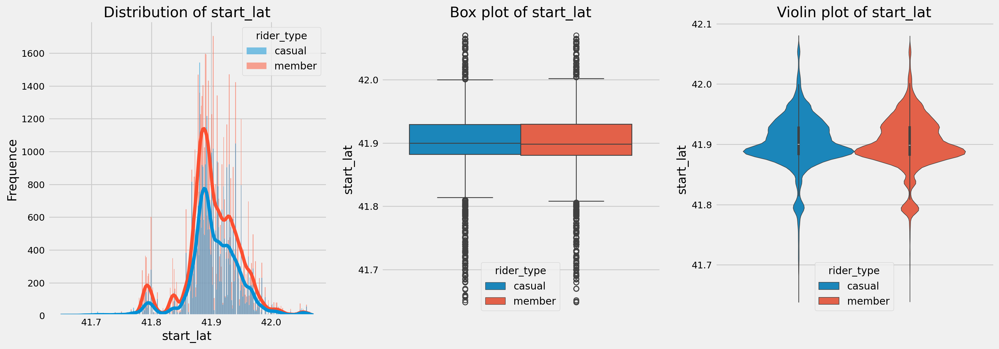


[`start_lng`]
Skewness:
rider_type
casual   -1.0100
member   -0.7400
Name: start_lng, dtype: float64

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis:
rider_type
casual   2.7000
member   2.3300
Name: start_lng, dtype: float64

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        


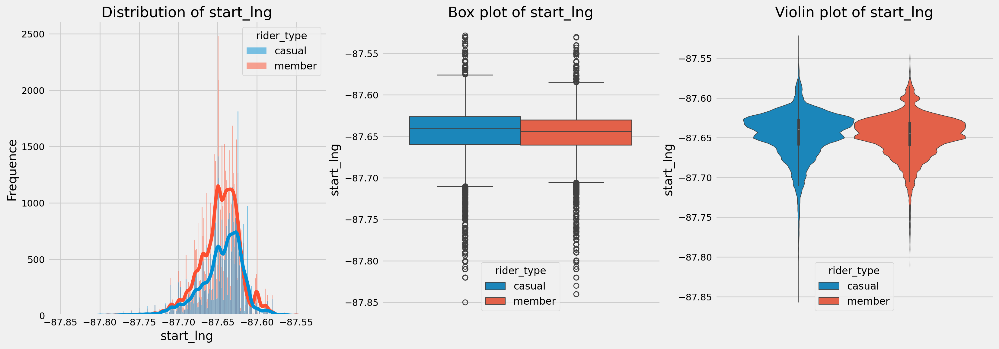


[`end_lat`]
Skewness:
rider_type
casual   -0.5000
member   -0.3200
Name: end_lat, dtype: float64

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis:
rider_type
casual   2.8700
member   1.7200
Name: end_lat, dtype: float64

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        


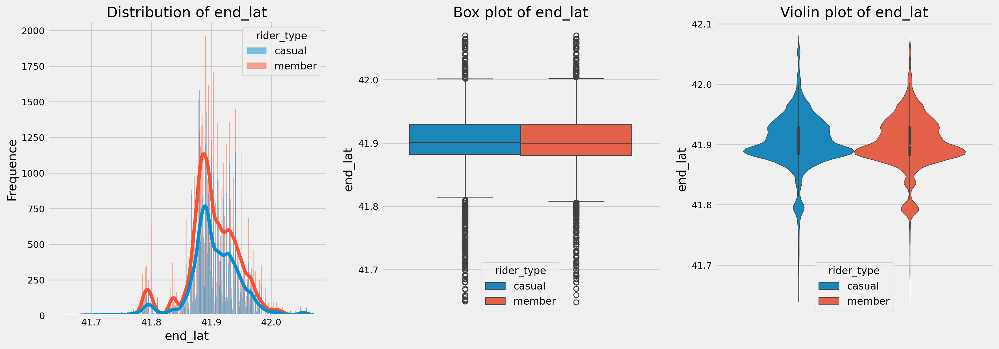


[`end_lng`]
Skewness:
rider_type
casual   -1.0100
member   -0.7500
Name: end_lng, dtype: float64

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis:
rider_type
casual   2.6600
member   2.4000
Name: end_lng, dtype: float64

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        


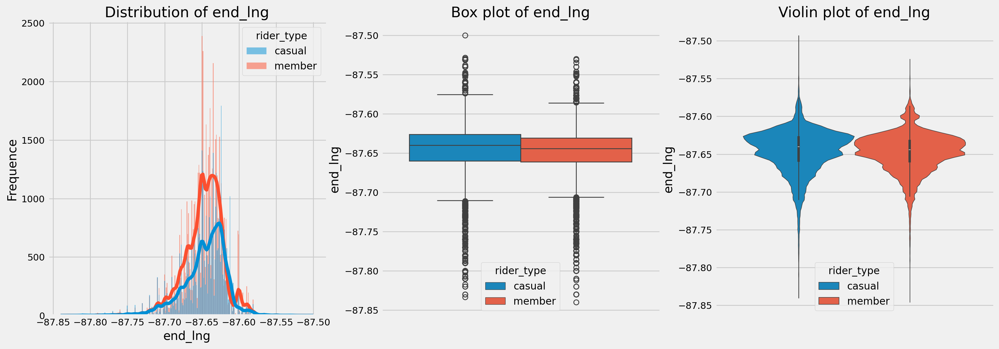


[`year`]
Skewness:
rider_type
casual    0.1400
member   -0.0400
Name: year, dtype: float64

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis:
rider_type
casual   -0.9400
member   -1.0600
Name: year, dtype: float64

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        


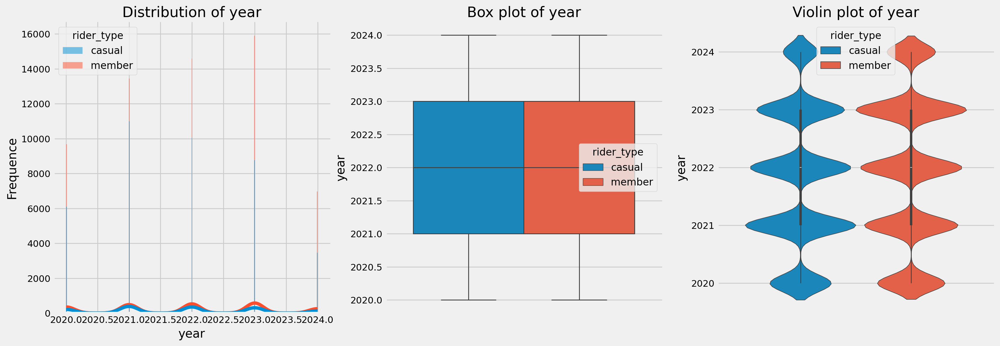


[`day`]
Skewness:
rider_type
casual   0.0300
member   0.0300
Name: day, dtype: float64

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis:
rider_type
casual   -1.1900
member   -1.1800
Name: day, dtype: float64

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        


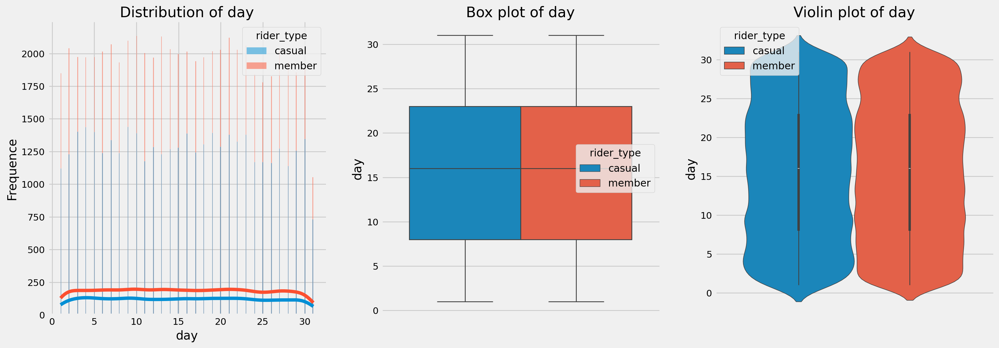


[`hour`]
Skewness:
rider_type
casual   -0.7600
member   -0.4400
Name: hour, dtype: float64

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis:
rider_type
casual    0.5300
member   -0.3800
Name: hour, dtype: float64

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        


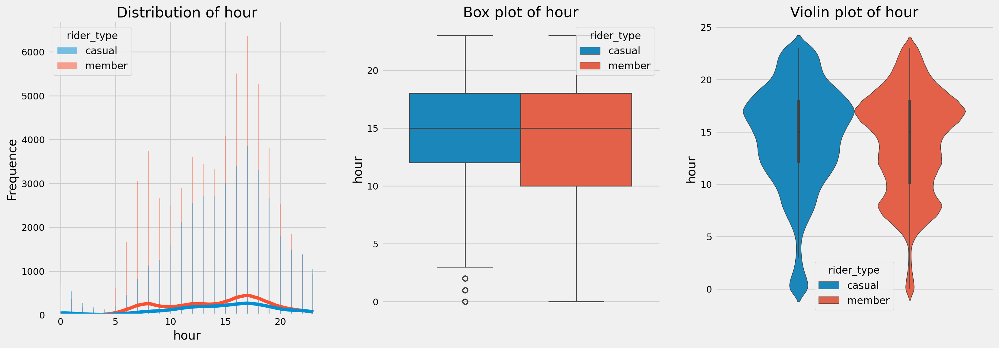


[`minute`]
Skewness:
rider_type
casual   -0.0100
member   -0.0000
Name: minute, dtype: float64

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis:
rider_type
casual   -1.2100
member   -1.2100
Name: minute, dtype: float64

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        


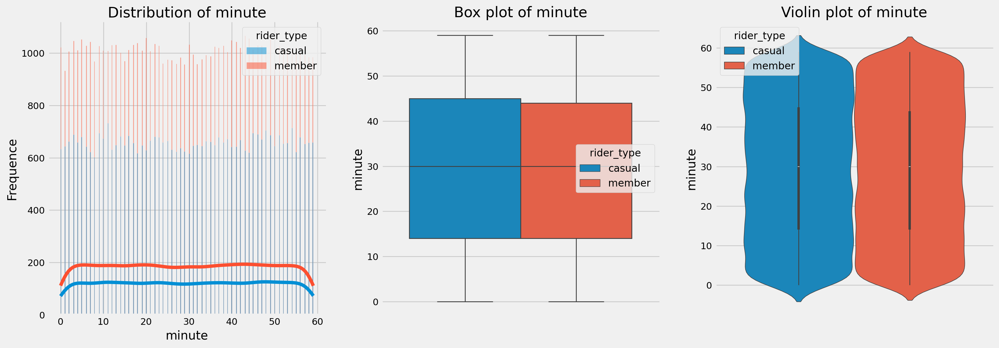


[`duration_min`]
Skewness:
rider_type
casual   189.9800
member    39.3900
Name: duration_min, dtype: float64

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis:
rider_type
casual   37,054.4300
member    2,792.4400
Name: duration_min, dtype: float64

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        


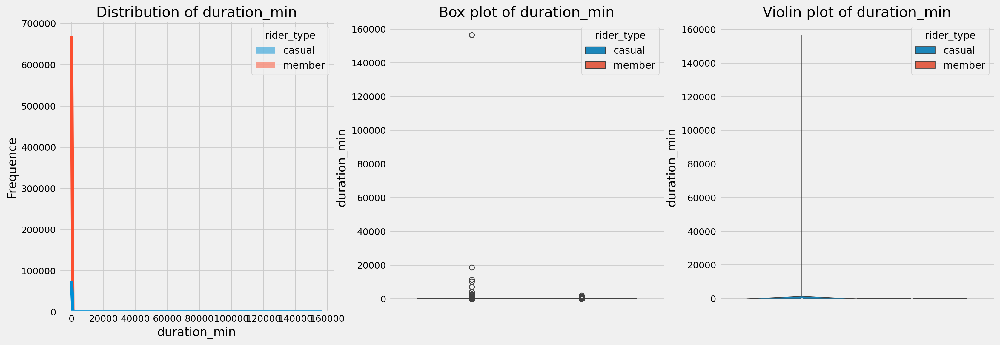


[`distance_km`]
Skewness:
rider_type
casual   2.2300
member   2.0000
Name: distance_km, dtype: float64

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis:
rider_type
casual   9.1200
member   5.9400
Name: distance_km, dtype: float64

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        


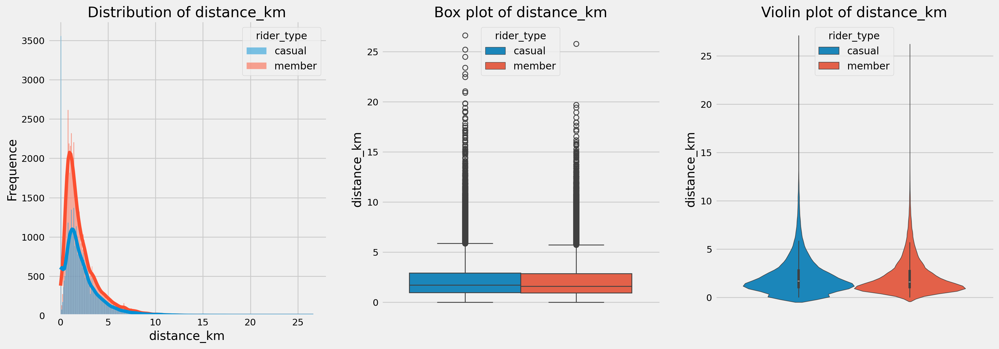


[`avg_speed_kmph`]
Skewness:
rider_type
casual   0.2000
member   0.0100
Name: avg_speed_kmph, dtype: float64

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis:
rider_type
casual   -0.3100
member    0.6600
Name: avg_speed_kmph, dtype: float64

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        


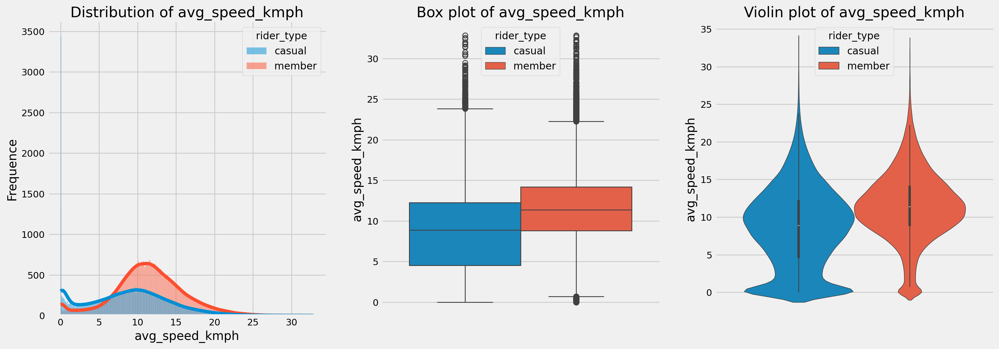

In [13]:
distplot(data.sample(n=1_00_000, random_state=12345), numeric_cols, by='rider_type')


[`start_lat`]
Skewness:
bike_type
electric_bike   -0.5800
regular_bike    -0.2200
Name: start_lat, dtype: float64

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis:
bike_type
electric_bike   2.2600
regular_bike    1.9900
Name: start_lat, dtype: float64

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        


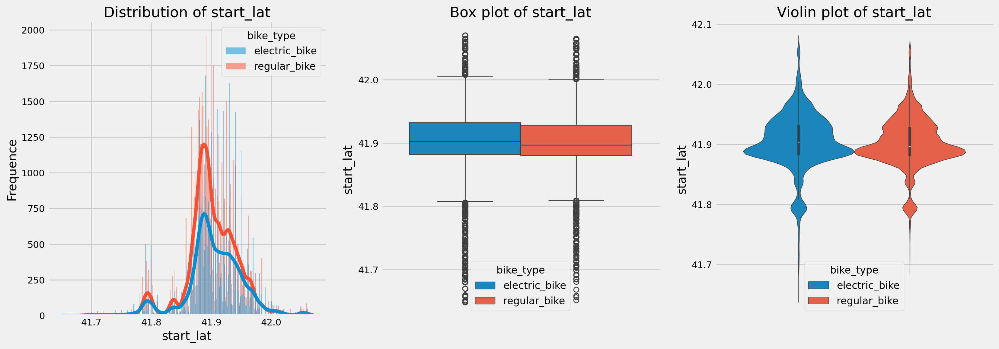


[`start_lng`]
Skewness:
bike_type
electric_bike   -0.8800
regular_bike    -0.4800
Name: start_lng, dtype: float64

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis:
bike_type
electric_bike   2.1600
regular_bike    1.3200
Name: start_lng, dtype: float64

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        


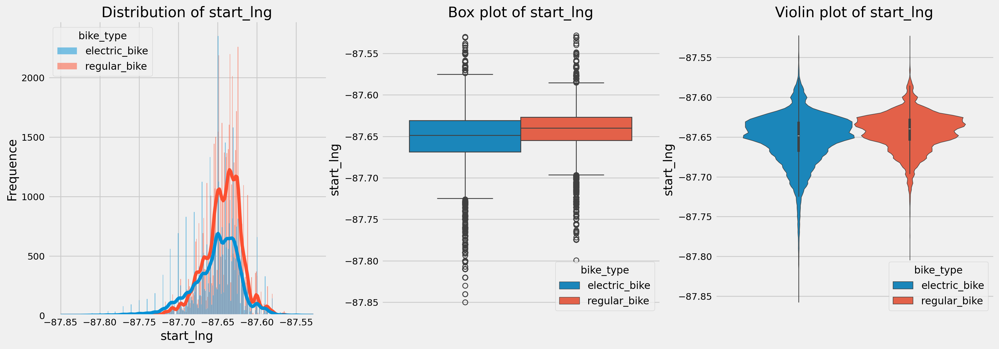


[`end_lat`]
Skewness:
bike_type
electric_bike   -0.5700
regular_bike    -0.2300
Name: end_lat, dtype: float64

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis:
bike_type
electric_bike   2.2700
regular_bike    1.9500
Name: end_lat, dtype: float64

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        


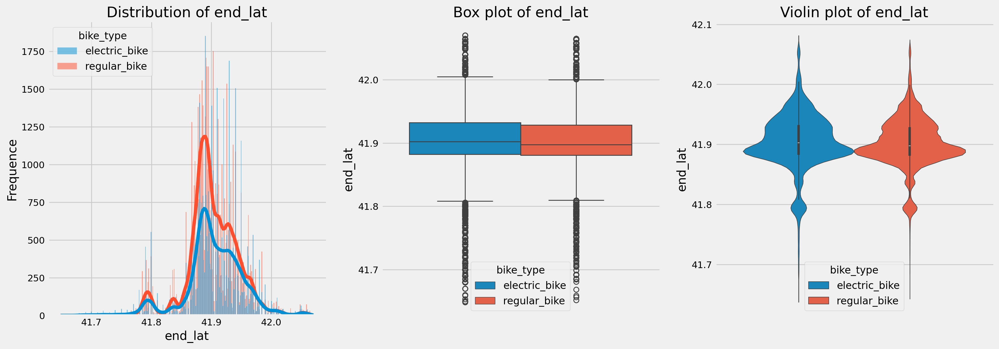


[`end_lng`]
Skewness:
bike_type
electric_bike   -0.9000
regular_bike    -0.4900
Name: end_lng, dtype: float64

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis:
bike_type
electric_bike   2.2300
regular_bike    1.3400
Name: end_lng, dtype: float64

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        


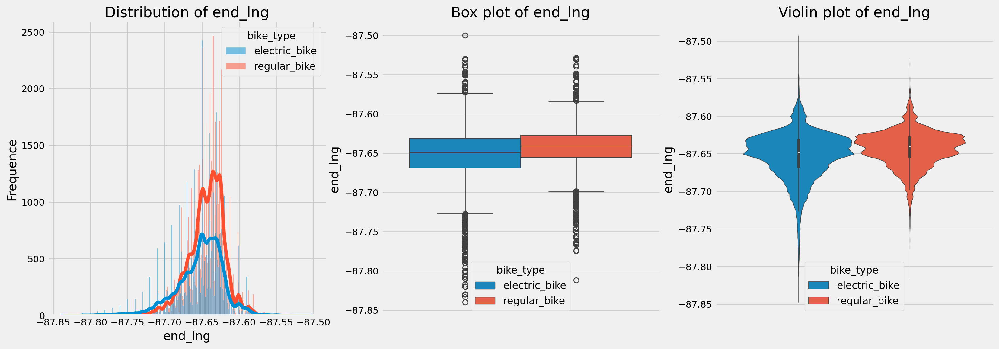


[`year`]
Skewness:
bike_type
electric_bike   -0.1400
regular_bike     0.2500
Name: year, dtype: float64

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis:
bike_type
electric_bike   -0.7300
regular_bike    -1.0800
Name: year, dtype: float64

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        


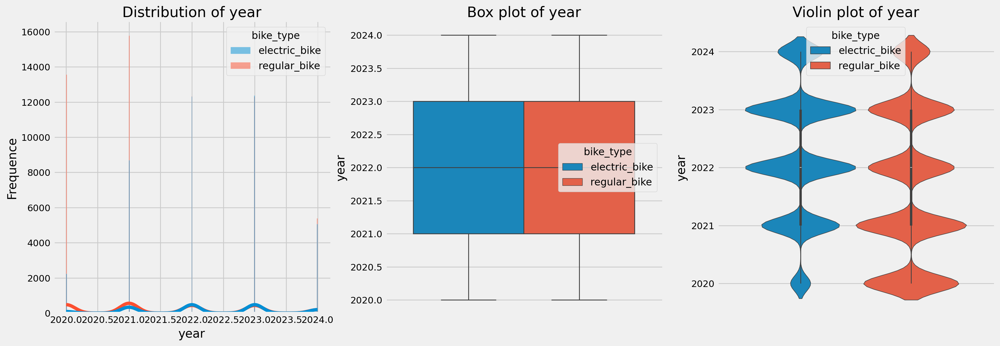


[`day`]
Skewness:
bike_type
electric_bike   0.0200
regular_bike    0.0400
Name: day, dtype: float64

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis:
bike_type
electric_bike   -1.1700
regular_bike    -1.1900
Name: day, dtype: float64

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        


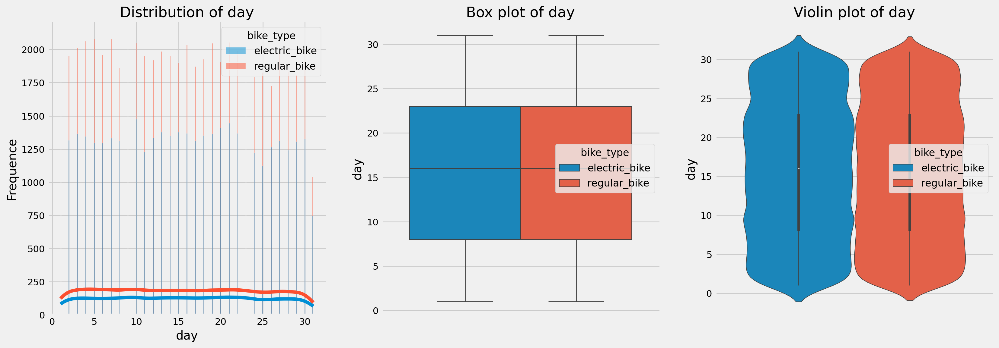


[`hour`]
Skewness:
bike_type
electric_bike   -0.5800
regular_bike    -0.5500
Name: hour, dtype: float64

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis:
bike_type
electric_bike   -0.0800
regular_bike    -0.0100
Name: hour, dtype: float64

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        


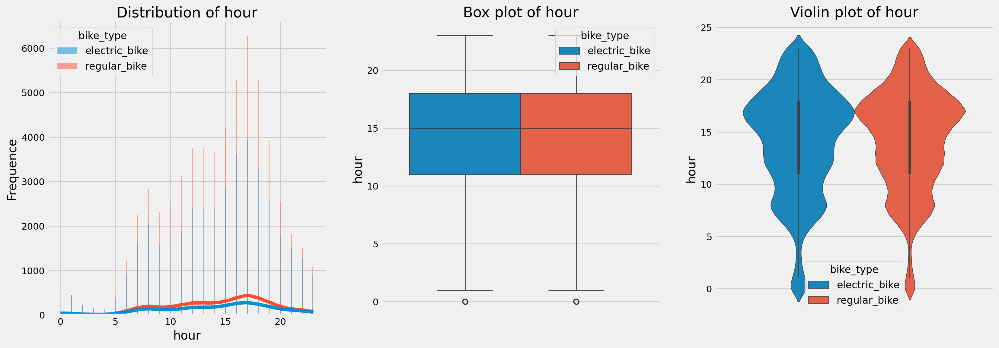


[`minute`]
Skewness:
bike_type
electric_bike   -0.0100
regular_bike     0.0000
Name: minute, dtype: float64

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis:
bike_type
electric_bike   -1.2100
regular_bike    -1.2100
Name: minute, dtype: float64

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        


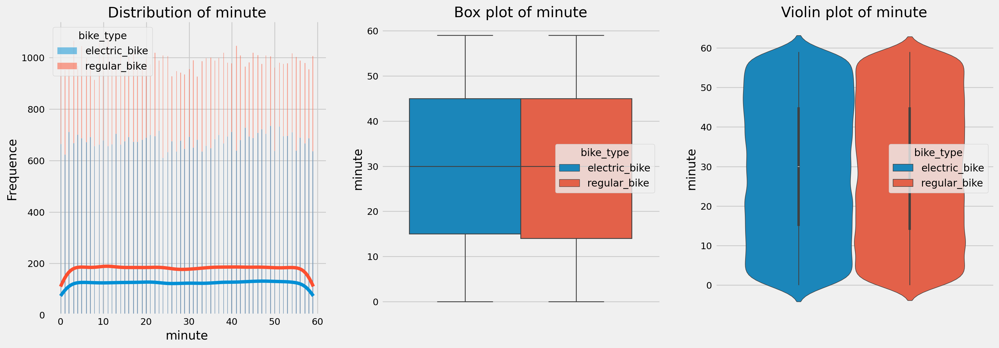


[`duration_min`]
Skewness:
bike_type
electric_bike     8.3100
regular_bike    232.8800
Name: duration_min, dtype: float64

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis:
bike_type
electric_bike      141.7900
regular_bike    55,714.1000
Name: duration_min, dtype: float64

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurt

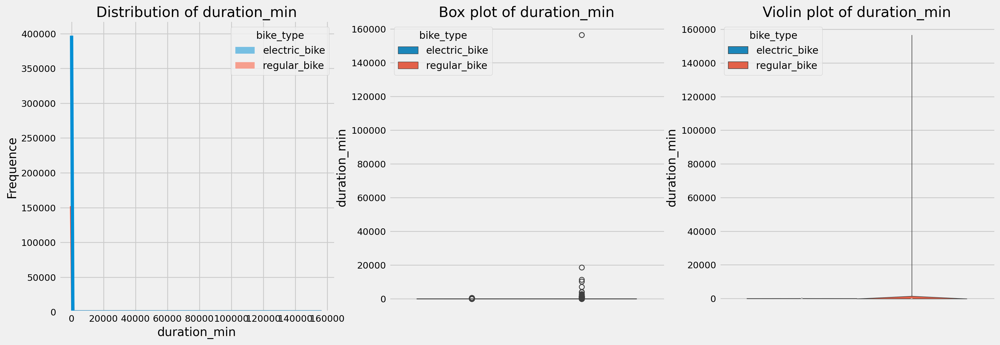


[`distance_km`]
Skewness:
bike_type
electric_bike   2.0400
regular_bike    2.1600
Name: distance_km, dtype: float64

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis:
bike_type
electric_bike   6.7200
regular_bike    8.0800
Name: distance_km, dtype: float64

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis - 3
        

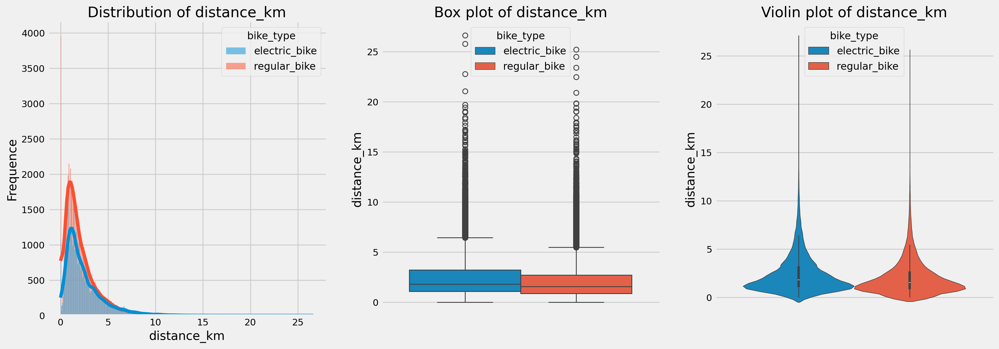


[`avg_speed_kmph`]
Skewness:
bike_type
electric_bike   -0.2200
regular_bike    -0.4800
Name: avg_speed_kmph, dtype: float64

        Note:
        1. Approximately symmetric: -0.5 < skewness < 0.5
        2. Moderately skewed:
                              -1 < skewness < -0.5 - left skewed, 
                             0.5 < skewness < 1    - right skewed
        3. Highly skewed: 
                            skewness < -1  - left skewed,
                            1 < skewness   - right skewed
        
Kurtosis:
bike_type
electric_bike   -0.0300
regular_bike    -0.3000
Name: avg_speed_kmph, dtype: float64

        Note:
        1. Mesokurtic: kurtosis = 3
           A normal distribution.
        2. Leptokurtic: kurtosis > 3
           A distribution has fatter tails and a sharper peak than the normal distribution.
        3. Platykurtic: kurtosis < 3
           A distribution has thinner tails and a flatter peak than the normal distribution.
    
        Excess Kurtosis: Kurtosis

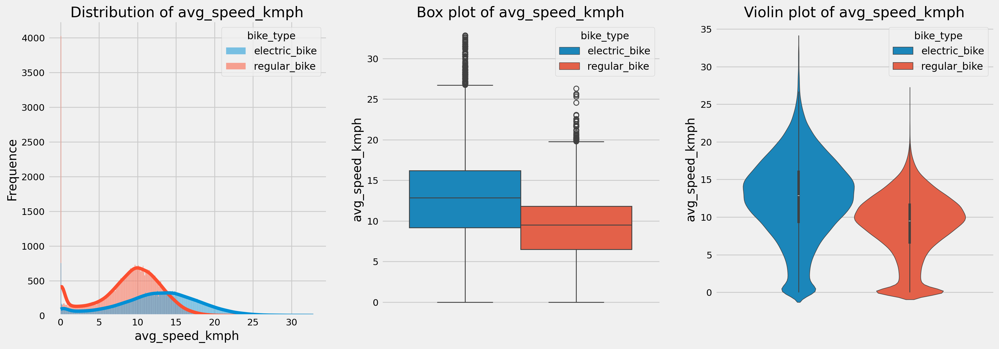

In [14]:
distplot(data.sample(n=1_00_000, random_state=12345), numeric_cols, by='bike_type')

#### Categorical Columns


[bike_type]
bike_type
electric_bike     9_021_126
regular_bike     13_130_653
Name: count, dtype: object


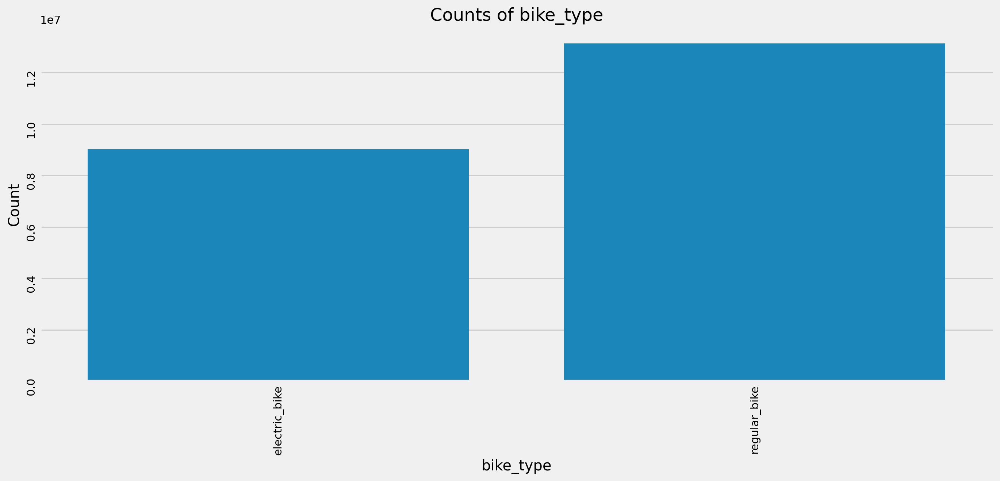


[rider_type]
rider_type
casual     8_773_989
member    13_377_790
Name: count, dtype: object


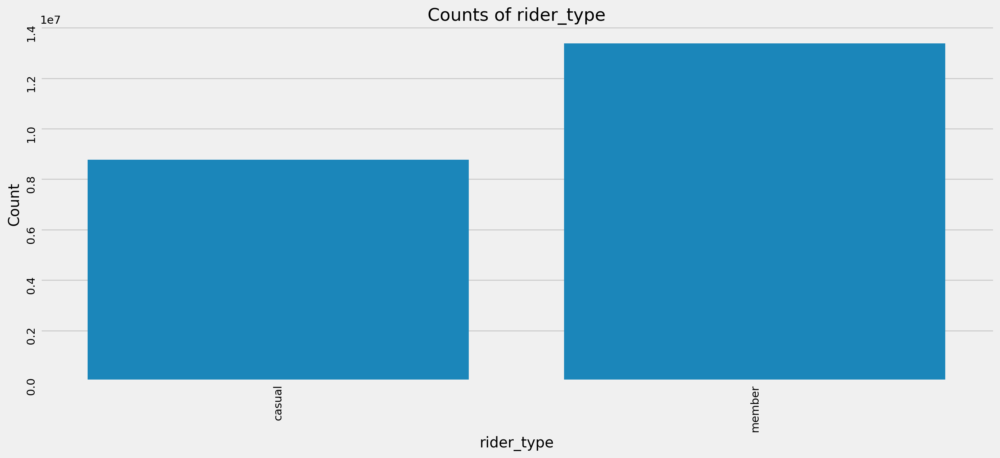


[year]
year
2020    3_463_814
2021    5_420_474
2022    5_460_732
2023    5_493_166
2024    2_313_593
Name: count, dtype: object


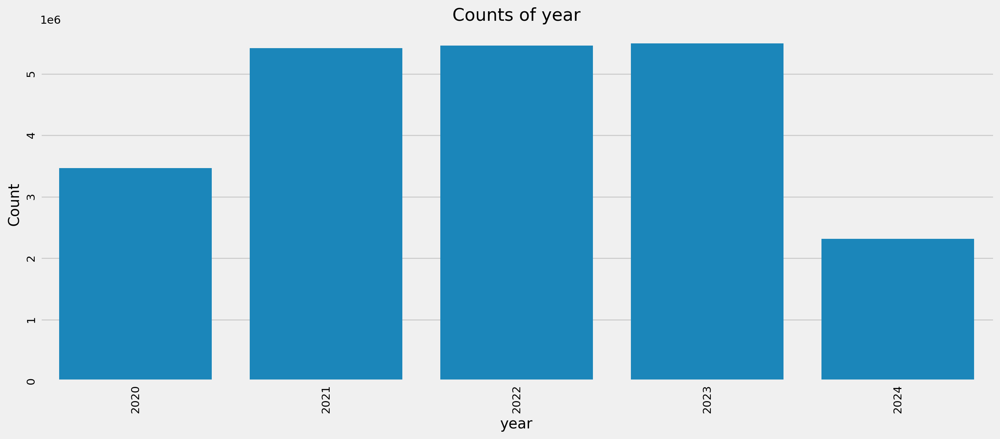


[quarter]
quarter
Q1    2_522_792
Q2    7_227_255
Q3    8_340_780
Q4    4_060_952
Name: count, dtype: object


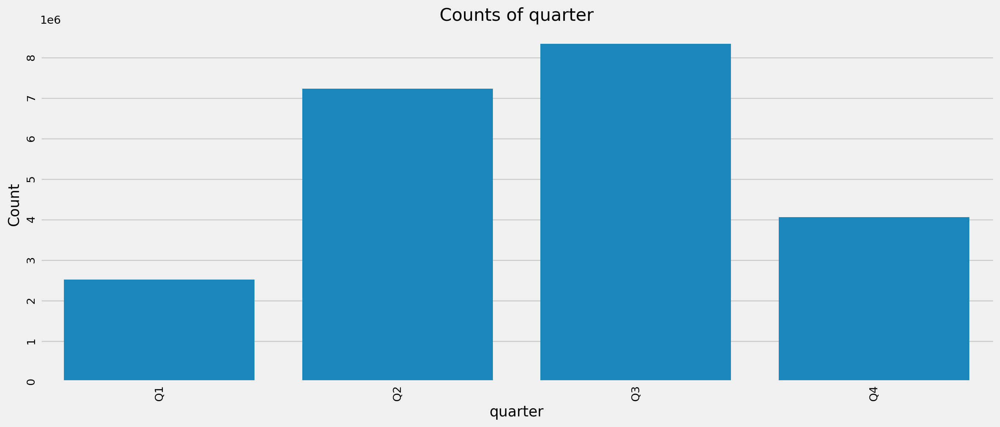


[month]
month
January        655_987
February       694_596
March        1_172_209
April        1_569_803
May          2_490_739
June         3_166_713
July         2_875_145
August       2_891_872
September    2_573_763
October      2_037_503
November     1_269_936
December       753_513
Name: count, dtype: object


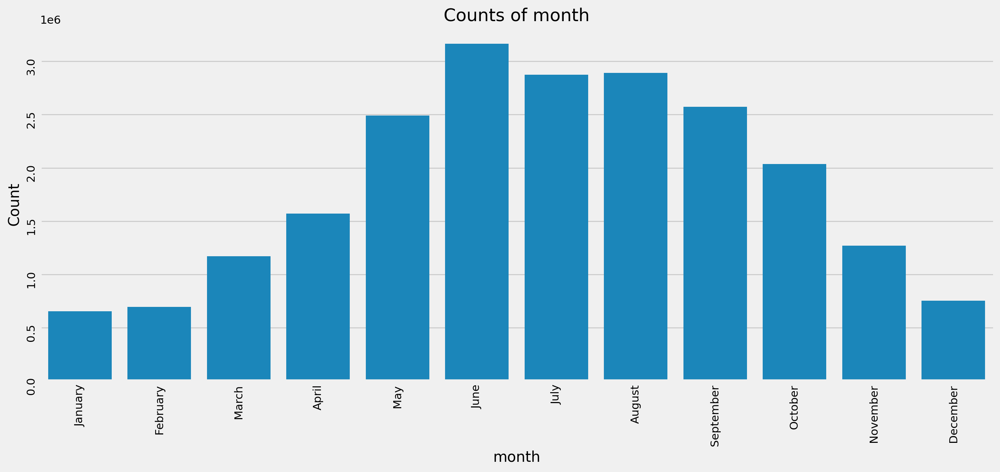


[day]
day
1     678_110
2     727_655
3     751_635
4     755_375
5     736_060
       ...   
27    717_301
28    669_651
29    696_075
30    727_075
31    405_468
Name: count, Length: 31, dtype: object


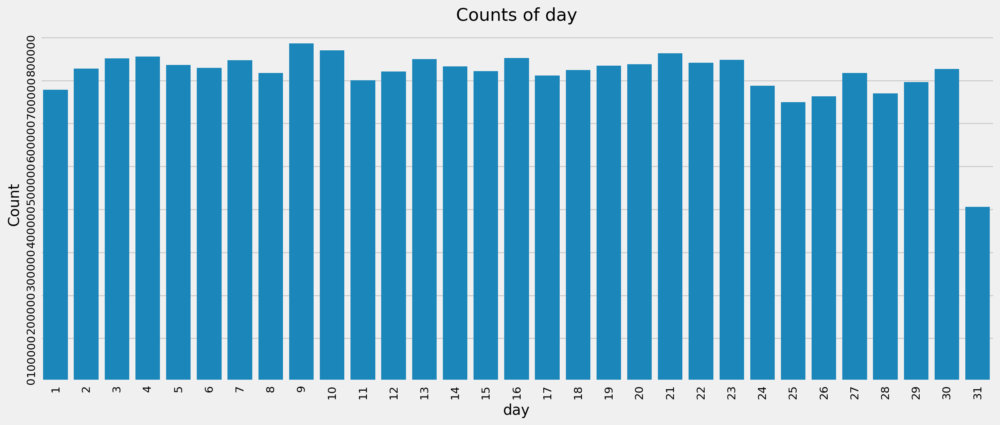


[hour]
hour
0       287_776
1       185_592
2       111_465
3        65_177
4        59_780
        ...    
19    1_380_892
20      964_712
21      749_269
22      610_222
23      428_898
Name: count, Length: 24, dtype: object


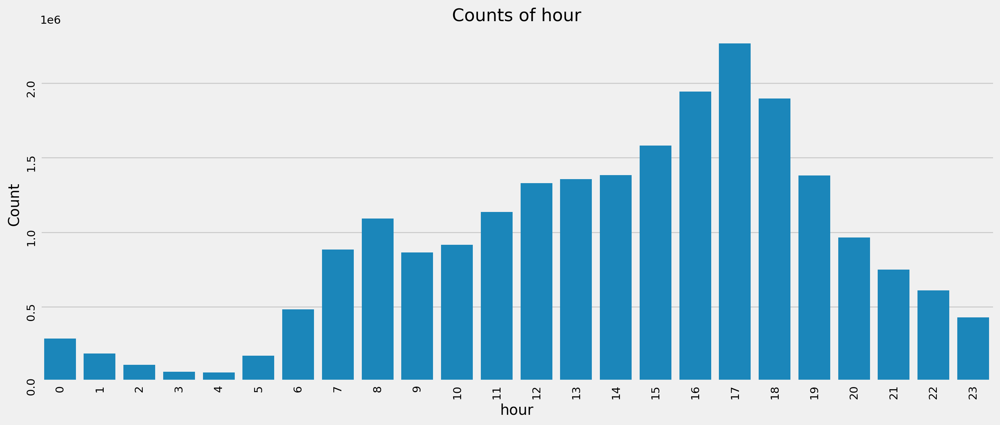


[minute]
minute
0     357_080
1     358_304
2     362_599
3     364_469
4     368_270
       ...   
55    367_748
56    365_834
57    363_927
58    361_886
59    358_066
Name: count, Length: 60, dtype: object


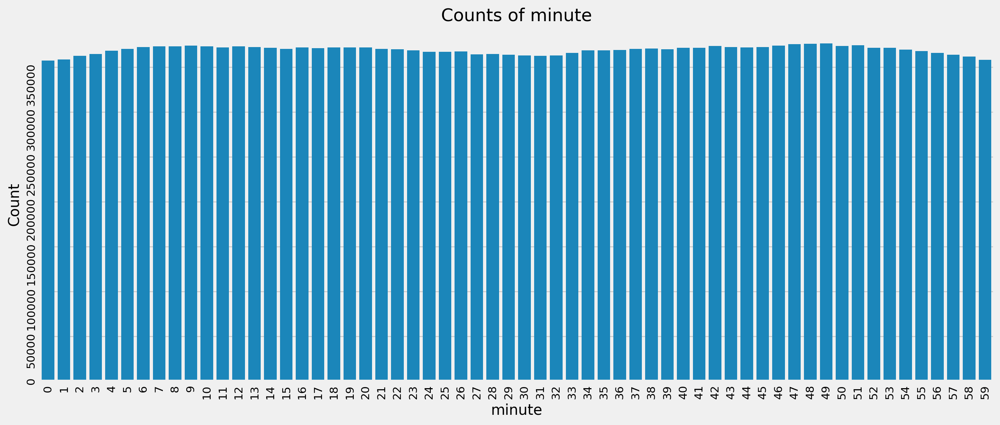


[season]
season
Winter    2_104_096
Spring    5_232_751
Summer    8_933_730
Autumn    5_881_202
Name: count, dtype: object


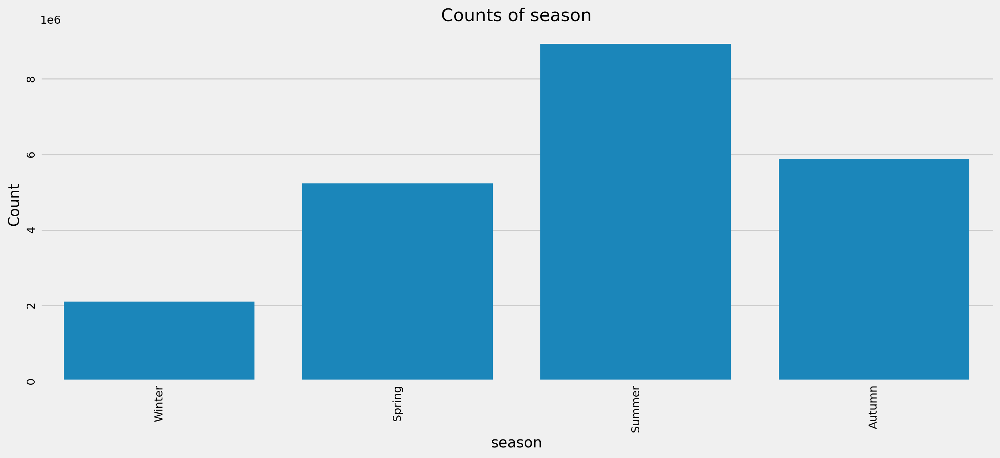


[weekday]
weekday
Monday       2_838_183
Tuesday      3_028_938
Wednesday    3_131_334
Thursday     3_166_049
Friday       3_201_261
Saturday     3_660_472
Sunday       3_125_542
Name: count, dtype: object


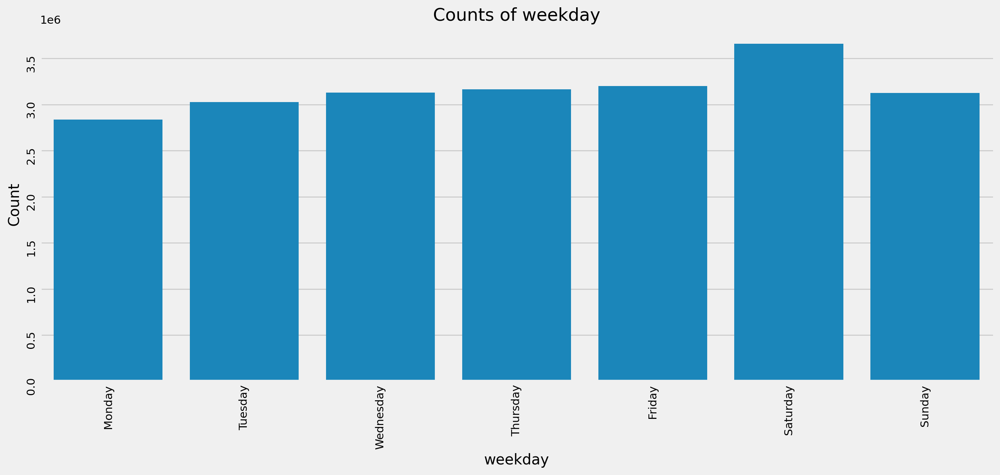


[part_day]
part_day
Late Night         650_010
Early Morning    1_597_791
Morning          4_009_139
Noon             5_653_435
Evening          7_488_303
Night            2_753_101
Name: count, dtype: object


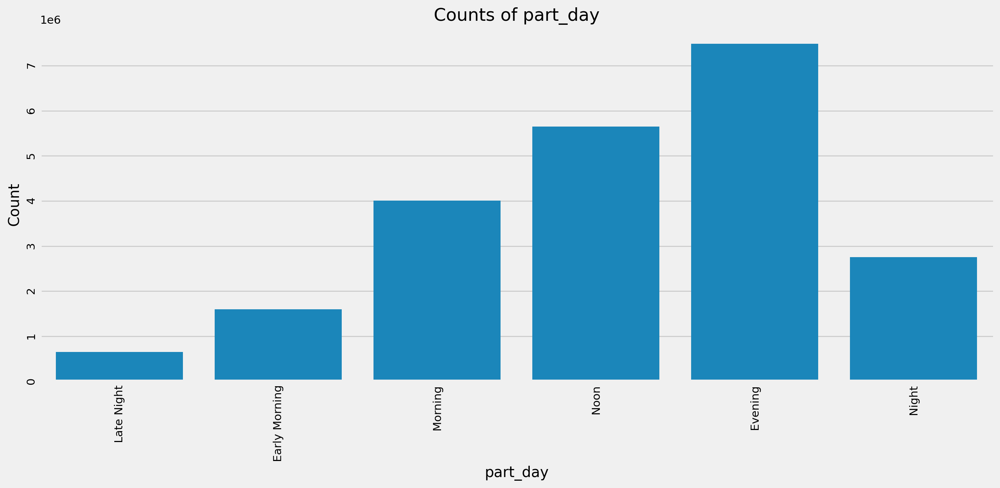

In [15]:
for i, col in zip(range(11), ['bike_type', 'rider_type', 'year', 'quarter', 
                             'month', 'day', 'hour', 'minute', 'season', 'weekday', 'part_day']):
    print(f'\n[{col}]')
    # summary table for the variable
    col_table = data[col].value_counts().sort_index()
    print(col_table.map('{:_}'.format))
    plt.figure(figsize = (15, 6))
    sns.countplot(x=col, data=data, order=col_table.index)    
    #axes[i].bar_label(axes[i].containers[0])
    plt.tick_params(labelrotation=90)
    plt.title(f'Counts of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.show()

#### Bivariate Analysis <a name='bivariate-analysis'></a>

In [16]:
# TODO: Use median instead of mean for `distance_km`, `duration_min` and `avg_speed_kmph`, such as median is more robust to outliers

##### By `duration_min`

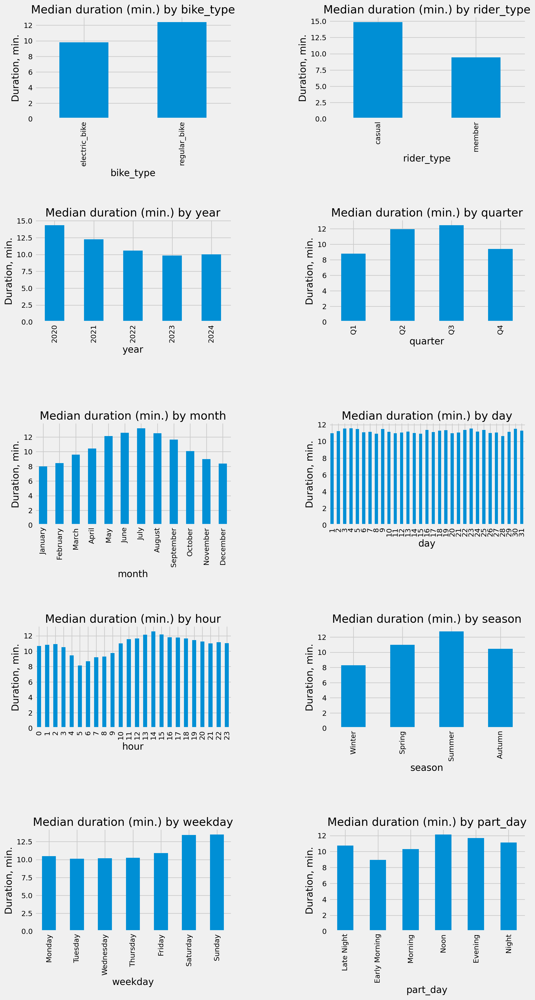

In [17]:
fir, axarr = plt.subplots(5, 2, figsize=(12, 24))
col = 'duration_min'
for i, column in zip(range(10), ['bike_type', 'rider_type', 'year', 'quarter', 
                             'month', 'day', 'hour', 'season', 'weekday', 'part_day']):
    ax = axarr[i//2][i%2]
    data.groupby(column, observed=True)[col].median().sort_index().plot.bar(ax=ax)
 
    ax.set_title(f"Median duration (min.) by {column}")
    ax.set_ylabel(f'Duration, min.')

plt.subplots_adjust(hspace=1.0)
plt.subplots_adjust(wspace=.5)
sns.despine()

##### By `distance_km`

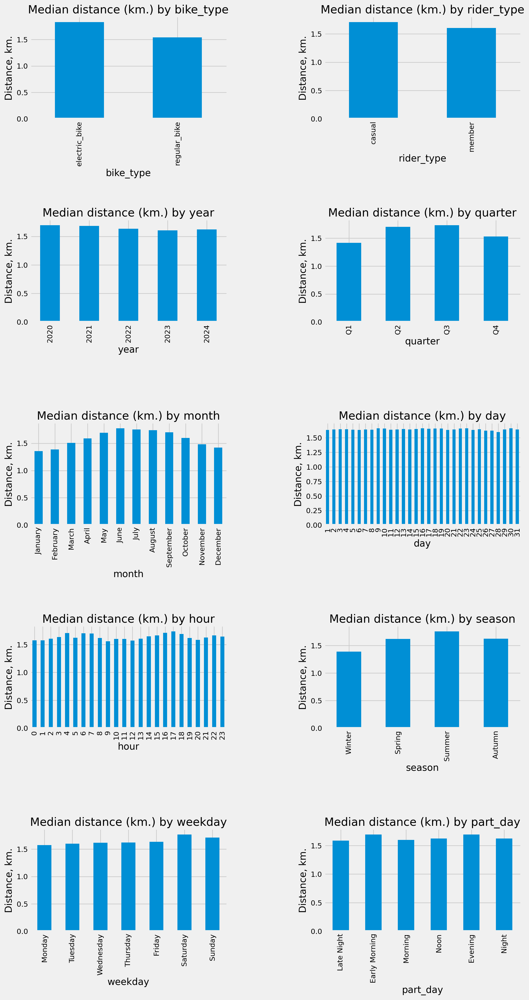

In [18]:
fir, axarr = plt.subplots(5, 2, figsize=(12, 24))
col = 'distance_km'
for i, column in zip(range(10), ['bike_type', 'rider_type', 'year', 'quarter', 
                             'month', 'day', 'hour', 'season', 'weekday', 'part_day']):
    ax = axarr[i//2][i%2]
    data.groupby(column, observed=True)[col].median().sort_index().plot.bar(ax=ax, )
 
    ax.set_title(f"Median distance (km.) by {column}")
    ax.set_ylabel(f'Distance, km.')

plt.subplots_adjust(hspace=1.0)
plt.subplots_adjust(wspace=.5)
sns.despine()

##### By `avg_speed_kmph`

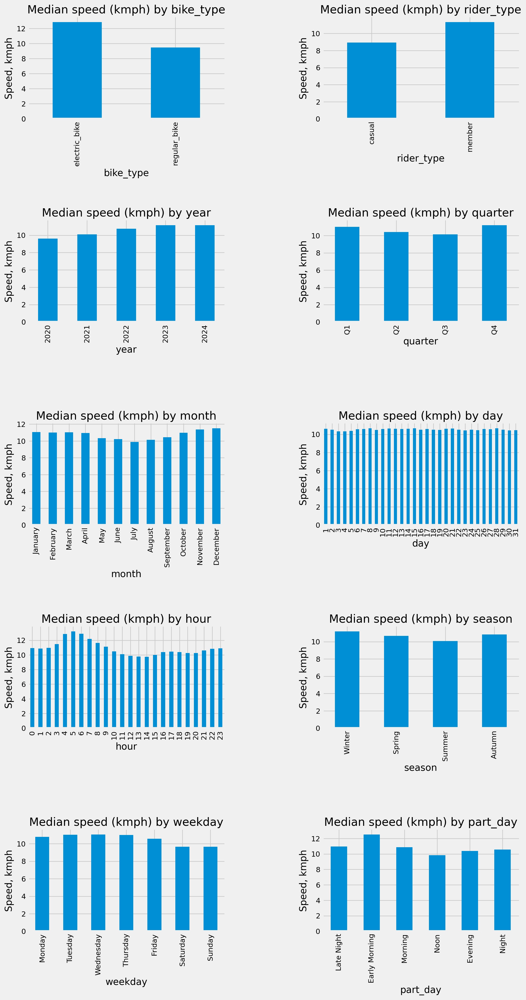

In [19]:
fir, axarr = plt.subplots(5, 2, figsize=(12, 24))
col = 'avg_speed_kmph'
for i, column in zip(range(10), ['bike_type', 'rider_type', 'year', 'quarter', 
                             'month', 'day', 'hour', 'season', 'weekday', 'part_day']):
    ax = axarr[i//2][i%2]
    data.groupby(column, observed=True)[col].median().sort_index().plot.bar(ax=ax)
 
    ax.set_title(f"Median speed (kmph) by {column}")
    ax.set_ylabel(f'Speed, kmph')

plt.subplots_adjust(hspace=1.0)
plt.subplots_adjust(wspace=.5)
sns.despine()

In [20]:
data.groupby(['rider_type', 'bike_type'], observed=True)[['duration_min', 'distance_km', 'avg_speed_kmph']].agg(['median'])

duration_min distance_km avg_speed_kmph
                               median      median         median
rider_type bike_type                                            
casual     electric_bike      11.5667      1.8648        11.4032
           regular_bike       18.1500      1.6260         7.4955
member     electric_bike       8.7833      1.8075        13.7304
           regular_bike        9.9667      1.4850        10.3254

#### Heatmap

In [21]:
from folium.plugins import HeatMap
import folium

# Chicago latitude and longitude values
latitude = 41.881832
longitude = -87.623177

In [22]:
def heatmap(df):
    """
        Displays a heatmap on Chicago city map.

        Args:
            df (pandas.DataFrame): A data frame with GPS coordinates and number of rides.

        Return:
            A heat map.
    """
    chicago_map = folium.Map(location=[latitude, longitude], zoom_start=10)
    HeatMap(df, min_opacity=0.4, blur=18).add_to(folium.FeatureGroup(name='Heat Map').add_to(chicago_map))
    
    return chicago_map

##### All Rides

In [23]:
heatmap(data.loc[:, ['start_lat', 'start_lng']].apply(np.round, decimals=4). \
            groupby(['start_lat', 'start_lng']).size().reset_index())

##### Casual riders

In [24]:
heatmap(data.loc[data['rider_type'] == 'casual', ['start_lat', 'start_lng']].apply(np.round, decimals=4). \
            groupby(['start_lat', 'start_lng']).size().reset_index())

##### Subsribers

In [25]:
heatmap(data.loc[data['rider_type'] == 'member', ['start_lat', 'start_lng']].apply(np.round, decimals=4). \
            groupby(['start_lat', 'start_lng']).size().reset_index())

##### Regular Bikes

In [26]:
heatmap(data.loc[data['bike_type'] == 'regular_bike', ['start_lat', 'start_lng']].apply(np.round, decimals=4). \
            groupby(['start_lat', 'start_lng']).size().reset_index())

##### Electric Bikes

In [27]:
heatmap(data.loc[data['bike_type'] == 'electric_bike', ['start_lat', 'start_lng']].apply(np.round, decimals=4). \
            groupby(['start_lat', 'start_lng']).size().reset_index())

### Save the Data

In [30]:
# save processed dataset fot further analysis
data_divvy = data
%store data_divvy

Stored 'data_divvy' (DataFrame)


In [29]:
%load_ext watermark
%watermark -d -t -v -p numpy,pandas,matplotlib,seaborn,sklearn,statsmodels

Python implementation: CPython
Python version       : 3.12.4
IPython version      : 8.26.0

numpy      : 2.0.0
pandas     : 2.2.2
matplotlib : 3.9.1
seaborn    : 0.13.2
sklearn    : 1.5.1
statsmodels: 0.14.2




---
\
[__<< Data Cleaning__](./02_Divvy_data_cleaning.ipynb) | [__Home__](../README.md) | [__Feature Engineering >>__](./04_Divvy_feature_engineering.ipynb)
\
\
Divvy: Bike Sharing Forecast, _August 2024_